In [4]:
import os
from functools import partial
import random
from typing import Any, List, Tuple, Dict
from types import ModuleType

import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as module_optimizer
import torch.optim.lr_scheduler as module_scheduler

import mafat_radar_challenge.data_loader.augmentation as module_aug
import mafat_radar_challenge.data_loader.data_loaders as module_data
import mafat_radar_challenge.model.loss as module_loss
import mafat_radar_challenge.model.metric as module_metric
import mafat_radar_challenge.model.model as module_arch
from mafat_radar_challenge.trainer import Trainer, MAFATTrainer
from mafat_radar_challenge.utils import setup_logger
from mafat_radar_challenge.tester import MAFATTester
import mafat_radar_challenge.data_loader.data_splitter as module_splitter
import mafat_radar_challenge.data_loader.samplers as module_sampler

from mafat_radar_challenge.main import get_instance
from mafat_radar_challenge.cli import load_config

from mafat_radar_challenge.utils import fft, normalize, max_value_on_doppler, hann

In [2]:
cfg = load_config("../../experiments/training-template.yml")

validation_splitter = get_instance(module_splitter, "splitter", cfg)
transforms = get_instance(module_aug, "augmentation", cfg)

# Sampler addition
if "sampler" in cfg:
    sampler = getattr(module_sampler, cfg["sampler"]["type"])
    sampler = partial(sampler, **cfg["sampler"]["args"])
else:
    sampler = None
cfg["data_loader"]["args"]["sampler"] = sampler

data_loader = get_instance(
    module_data, "data_loader", cfg, transforms, validation_splitter
)
valid_data_loader = data_loader.split_validation()

In [3]:
df = valid_data_loader.dataset.df
data = valid_data_loader.dataset.data

In [4]:
validation_df = df.loc[valid_data_loader.dataset.data_indexes]
train_df = df.loc[data_loader.dataset.data_indexes]

In [5]:
valid_spect = data["iq_x_spectrogram"][valid_data_loader.dataset.data_indexes]
train_spect = data["iq_x_spectrogram"][data_loader.dataset.data_indexes]

In [6]:
validation_df.geolocation_type.unique()

array(['D'], dtype=object)

In [7]:
df[df["geolocation_type"]!="C"]

,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
230,230,230,210,D,4,4,HighSNR,29,0
231,231,231,210,D,4,4,HighSNR,29,0
232,232,232,210,D,4,4,HighSNR,29,0
233,233,233,215,D,4,4,HighSNR,29,0
234,234,234,215,D,4,4,HighSNR,29,0
...,...,...,...,...,...,...,...,...,...
6651,6651,6651,300,D,4,4,LowSNR,32,1
6652,6652,6652,300,D,4,4,LowSNR,32,1
6653,6653,6653,300,D,4,4,LowSNR,32,1
6654,6654,6654,347,D,4,4,LowSNR,32,1


In [8]:
train_df.target_type.unique()

array([0, 1])

4
D


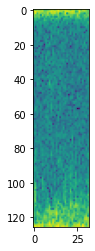

4
D


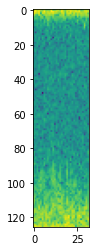

4
D


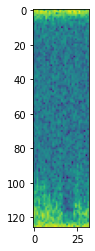

4
D


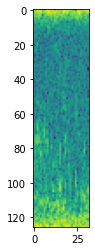

4
D


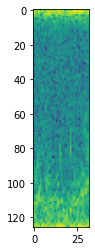

4
D


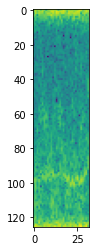

4
D


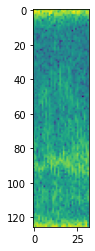

4
D


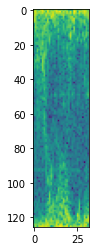

4
D


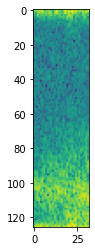

4
D


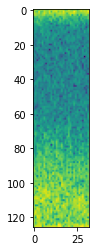

In [9]:
for idx, (row, x) in enumerate(validation_df.iterrows()):
    if idx == 10:
        break
    if x.target_type == 0:
        plt.figure()
        print(x.sensor_id)
        print(x.geolocation_type)
        plt.imshow(valid_spect[idx])
        plt.show()

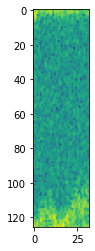

In [10]:
plt.imshow(train_spect[2])

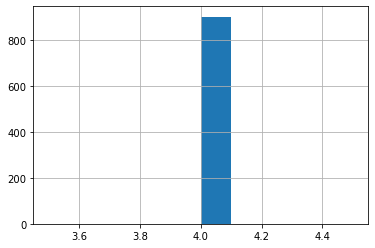

In [11]:
validation_df.sensor_id.hist()

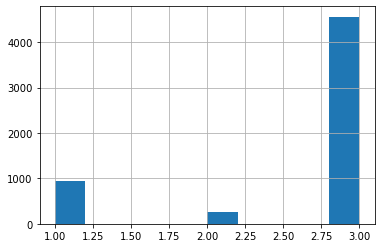

In [12]:
train_df.sensor_id.hist()

In [13]:
df.sensor_id.unique()

array([1, 4, 2, 3])

In [26]:
a = list()
for l, g in df.groupby(["geolocation_type"]):
    a.append(set(g.track_id))

# Training metadata

In [1]:
import pandas as pd
training_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v1.csv")

In [19]:
training_df.shape

(6656, 8)

In [21]:
training_df.track_id.unique().shape

(1510,)

In [28]:
training_df.groupby(["geolocation_type", "sensor_id", "target_type"]).count()

segment_id  track_id  geolocation_id  \
geolocation_type sensor_id target_type                                         
A                2         0                   251       251             251   
                 3         0                  4560      4560            4560   
C                1         0                   468       468             468   
                           1                   476       476             476   
D                4         0                   478       478             478   
                           1                   423       423             423   

                                        snr_type  date_index  
geolocation_type sensor_id target_type                        
A                2         0                 251         251  
                 3         0                4560        4560  
C                1         0                 468         468  
                           1                 476         476  
D                4         0                 478         478  
                           1                 423         423

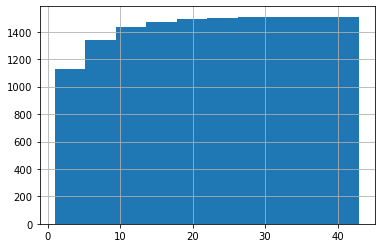

In [20]:
training_df.groupby("track_id").count().segment_id.hist(cumulative=True)

# Aux metadata

In [37]:
aux_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Auxiliary Experiment Set V2.csv")

In [25]:
aux_df.groupby("geolocation_type").count()

,segment_id,track_id,geolocation_id,sensor_id,snr_type,date_index,target_type
geolocation_type,,,,,,,
C,13968,13968,13968,13968,13968,13968,13968
D,35103,35103,35103,35103,35103,35103,35103


In [27]:
aux_df.groupby(["geolocation_type", "sensor_id", "target_type"]).count()

segment_id  track_id  geolocation_id  \
geolocation_type sensor_id target_type                                         
C                5         human              5149      5149            5149   
                 6         human              5764      5764            5764   
                 7         human              3055      3055            3055   
D                8         human              5603      5603            5603   
                 9         human              2715      2715            2715   
                 10        human              6153      6153            6153   
                 11        human              5453      5453            5453   
                 12        human              8013      8013            8013   
                 13        human              7166      7166            7166   

                                        snr_type  date_index  
geolocation_type sensor_id target_type                        
C                5         human            5149        5149  
                 6         human            5764        5764  
                 7         human            3055        3055  
D                8         human            5603        5603  
                 9         human            2715        2715  
                 10        human            6153        6153  
                 11        human            5453        5453  
                 12        human            8013        8013  
                 13        human            7166        7166

In [22]:
aux_df.shape

(49071, 8)

In [17]:
aux_df.track_id.unique().shape

(2718,)

In [38]:
aux_df.loc[aux_df.target_type == "human", "target_type"] = 1
aux_df.loc[aux_df.target_type == "animal", "target_type"] = 0

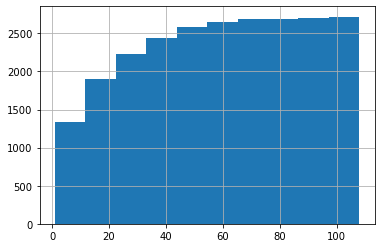

In [15]:
aux_df.groupby("track_id").count().segment_id.hist(cumulative=True)

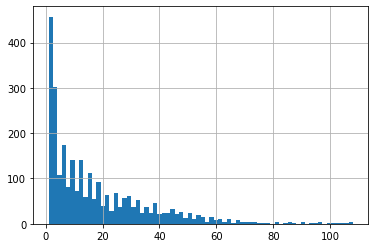

In [18]:
aux_df.groupby("track_id").count().segment_id.hist(bins=70)

# Full df

In [39]:
full_df = pd.concat([training_df, aux_df])

In [41]:
full_df.groupby(["target_type"]).count()

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index
target_type,,,,,,,
0,5757,5757,5757,5757,5757,5757,5757
1,49970,49970,49970,49970,49970,49970,49970


In [40]:
full_df.groupby(["geolocation_type", "sensor_id", "target_type"]).count()

segment_id  track_id  geolocation_id  \
geolocation_type sensor_id target_type                                         
A                2         0                   251       251             251   
                 3         0                  4560      4560            4560   
C                1         0                   468       468             468   
                           1                   476       476             476   
                 5         1                  5149      5149            5149   
                 6         1                  5764      5764            5764   
                 7         1                  3055      3055            3055   
D                4         0                   478       478             478   
                           1                   423       423             423   
                 8         1                  5603      5603            5603   
                 9         1                  2715      2715            2715   
                 10        1                  6153      6153            6153   
                 11        1                  5453      5453            5453   
                 12        1                  8013      8013            8013   
                 13        1                  7166      7166            7166   

                                        snr_type  date_index  
geolocation_type sensor_id target_type                        
A                2         0                 251         251  
                 3         0                4560        4560  
C                1         0                 468         468  
                           1                 476         476  
                 5         1                5149        5149  
                 6         1                5764        5764  
                 7         1                3055        3055  
D                4         0                 478         478  
                           1                 423         423  
                 8         1                5603        5603  
                 9         1                2715        2715  
                 10        1                6153        6153  
                 11        1                5453        5453  
                 12        1                8013        8013  
                 13        1                7166        7166

# Analysing training and validation data

In [2]:
import pandas as pd
train_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v5.csv")
val_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_val_v5.csv")

In [13]:
train_df.segment_id.unique().shape

(55418,)

In [11]:
train_df.groupby("source").count()/len(train_df)

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
source,,,,,,,,
aux,0.462519,0.462519,0.462519,0.462519,0.462519,0.462519,0.462519,0.462519
synth,0.477657,0.477657,0.477657,0.477657,0.477657,0.477657,0.477657,0.477657
train,0.059824,0.059824,0.059824,0.059824,0.059824,0.059824,0.059824,0.059824


In [15]:
pos_segments = train_df[train_df.source == "train"].segment_id
neg_segments = train_df[train_df.source == "aux"].segment_id
pos_indexes = list(train_df[train_df.segment_id.isin(pos_segments)].index)
neg_indexes = list(train_df[train_df.segment_id.isin(neg_segments)].index)

In [20]:
train_df.loc[pos_indexes].shape

(8606, 9)

In [19]:
train_df.loc[neg_indexes].shape

(97489, 9)

In [23]:
100*8606/(8606 + 97489)

8.111598096045997

In [4]:
train_df.groupby(["target_type", "snr_type"]).count()

segment_id  track_id  geolocation_type  geolocation_id  \
target_type snr_type                                                           
0           HighSNR         1583      1583              1583            1583   
            LowSNR          4015      4015              4015            4015   
            SynthSNR        1583      1583              1583            1583   
1           HighSNR        49094     49094             49094           49094   
            LowSNR           726       726               726             726   
            SynthSNR       49094     49094             49094           49094   

                      sensor_id  date_index  source  
target_type snr_type                                 
0           HighSNR        1583        1583    1583  
            LowSNR         4015        4015    4015  
            SynthSNR       1583        1583    1583  
1           HighSNR       49094       49094   49094  
            LowSNR          726         726     726  
            SynthSNR      49094       49094   49094

# Analyse background data

In [115]:
import pickle
import pandas as pd

In [123]:
background_data_path = "/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Auxiliary Background(empty) Set V1.pkl"
with open(background_data_path, 'rb') as data:
    background_data = pickle.load(data)
background_data["iq_sweep_burst"].shape

(31128, 128, 32)

In [124]:
train_data_path = "/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Training Set V1.pkl"
with open(train_data_path, 'rb') as data:
    train_data = pickle.load(data)
train_data["iq_sweep_burst"].shape

(6656, 128, 32)

In [125]:
aux_data_path = "/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Auxiliary Experiment Set V2.pkl"
with open(aux_data_path, 'rb') as data:
    aux_data = pickle.load(data)
aux_data["iq_sweep_burst"].shape

(49071, 128, 32)

In [126]:
train_csv = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Training Set V1.csv")
train_csv.shape

(6656, 8)

In [127]:
aux_csv = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Auxiliary Experiment Set V2.csv")
aux_csv.shape

(49071, 8)

In [128]:
concat_df = pd.concat([train_csv, aux_csv])
concat_df.shape

(55727, 8)

In [130]:
concat_data = dict()
for key, value in train_data.items():
    concat_data[key] = np.concatenate([train_data[key], aux_data[key]])

In [132]:
concat_data["iq_sweep_burst"].shape

(55727, 128, 32)

In [133]:
background_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Auxiliary Background(empty) Set V1.csv")
background_df.shape

(31128, 8)

In [134]:
background_df["segment_id"] -= 1000000

In [53]:
print(train_df["snr_type"].unique())
print(sorted(train_df["sensor_id"].unique()))
print(train_df["geolocation_type"].unique())
print(sorted(train_df["geolocation_id"].unique()))

['HighSNR' 'LowSNR']
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
['C' 'D' 'A']
[1, 2, 3, 4, 5, 6, 7]


In [57]:
train_df.groupby(["sensor_id", "target_type"]).count()

segment_id  track_id  geolocation_type  geolocation_id  \
sensor_id target_type                                                           
1         animal              468       468               468             468   
          human               476       476               476             476   
2         animal              251       251               251             251   
3         animal             4560      4560              4560            4560   
4         animal              478       478               478             478   
          human               423       423               423             423   
5         human              5149      5149              5149            5149   
6         human              5764      5764              5764            5764   
7         human              3055      3055              3055            3055   
8         human              5603      5603              5603            5603   
9         human              2715      2715              2715            2715   
10        human              6153      6153              6153            6153   
11        human              5453      5453              5453            5453   
12        human              8013      8013              8013            8013   
13        human              7166      7166              7166            7166   

                       snr_type  date_index  
sensor_id target_type                        
1         animal            468         468  
          human             476         476  
2         animal            251         251  
3         animal           4560        4560  
4         animal            478         478  
          human             423         423  
5         human            5149        5149  
6         human            5764        5764  
7         human            3055        3055  
8         human            5603        5603  
9         human            2715        2715  
10        human            6153        6153  
11        human            5453        5453  
12        human            8013        8013  
13        human            7166        7166

In [54]:
print(background_df["snr_type"].unique())
print(sorted(background_df["sensor_id"].unique()))
print(background_df["geolocation_type"].unique())
print(sorted(background_df["geolocation_id"].unique()))

['HighSNR' 'LowSNR']
[2, 3, 5, 6, 7, 8, 9, 10]
['A' 'C' 'D']
[2, 3, 5, 6]


In [49]:
background_df[background_df["segment_id"].isin(train_df.segment_id)].shape

(22323, 8)

In [48]:
background_df.shape

(31128, 8)

In [69]:
train_df[train_df["segment_id"].isin(background_df.segment_id)].segment_id.unique().shape

(22089,)

In [83]:
dup_segments = background_df[background_df.segment_id.duplicated()].segment_id

In [85]:
background_df[background_df.segment_id.isin(dup_segments)].sort_values("segment_id")

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
0,421,349,A,2,2,HighSNR,5,empty
30889,421,349,C,5,5,LowSNR,4,empty
1,422,349,A,2,2,HighSNR,5,empty
30890,422,349,C,5,5,LowSNR,4,empty
2,423,349,A,2,2,HighSNR,5,empty
...,...,...,...,...,...,...,...,...
254,680,579,A,3,3,HighSNR,8,empty
31126,681,579,D,6,10,LowSNR,2,empty
255,681,579,A,3,3,HighSNR,8,empty
256,682,579,A,3,3,HighSNR,8,empty


In [100]:
background_df[background_df.segment_id.isin(dup_segments)].groupby(["geolocation_type"]).count()

,segment_id,track_id,geolocation_id,sensor_id,snr_type,date_index,target_type
geolocation_type,,,,,,,
A,234,234,234,234,234,234,234
C,96,96,96,96,96,96,96
D,138,138,138,138,138,138,138


In [101]:
background_df[background_df.segment_id.isin(dup_segments)].sort_values("segment_id")

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
0,421,349,A,2,2,HighSNR,5,empty
30889,421,349,C,5,5,LowSNR,4,empty
1,422,349,A,2,2,HighSNR,5,empty
30890,422,349,C,5,5,LowSNR,4,empty
2,423,349,A,2,2,HighSNR,5,empty
...,...,...,...,...,...,...,...,...
254,680,579,A,3,3,HighSNR,8,empty
31126,681,579,D,6,10,LowSNR,2,empty
255,681,579,A,3,3,HighSNR,8,empty
256,682,579,A,3,3,HighSNR,8,empty


In [92]:
duplicated_segments = background_data["iq_sweep_burst"][background_df[background_df.segment_id.isin(dup_segments)].sort_values("segment_id").index]

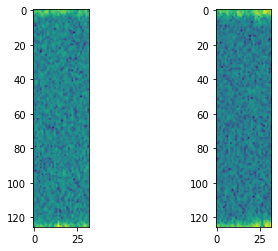

In [102]:
plt.subplot(121)
plt.imshow(fft(duplicated_segments[2]))
plt.subplot(122)
plt.imshow(fft(duplicated_segments[3]))

## Plot background vs authentic data

In [135]:
background_index = background_df[background_df["segment_id"].isin(concat_df.segment_id)].sort_values("segment_id").index
background_df[background_df["segment_id"].isin(concat_df.segment_id)].sort_values("segment_id")

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
30745,273,247,C,5,5,LowSNR,4,empty
30746,274,247,C,5,5,LowSNR,4,empty
30747,275,247,C,5,5,LowSNR,4,empty
30748,276,248,C,5,5,LowSNR,4,empty
30749,277,248,C,5,5,LowSNR,4,empty
...,...,...,...,...,...,...,...,...
30740,34381,262235,D,6,10,HighSNR,2,empty
30741,34382,262235,D,6,10,HighSNR,2,empty
30742,34383,262235,D,6,10,HighSNR,2,empty
30743,34384,262235,D,6,10,HighSNR,2,empty


In [136]:
concat_index = concat_df[concat_df["segment_id"].isin(background_df.segment_id)].index
concat_df[concat_df["segment_id"].isin(background_df.segment_id)]

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
273,273,247,D,4,4,HighSNR,30,animal
274,274,247,D,4,4,HighSNR,30,animal
275,275,247,D,4,4,HighSNR,30,animal
276,276,248,D,4,4,HighSNR,30,animal
277,277,248,D,4,4,HighSNR,30,animal
...,...,...,...,...,...,...,...,...
49066,10920,280731,D,7,13,LowSNR,3,human
49067,10921,280731,D,7,13,LowSNR,3,human
49068,10922,280997,D,7,13,LowSNR,3,human
49069,10923,281732,D,7,13,LowSNR,3,human


In [152]:
concat_index

Int64Index([  273,   274,   275,   276,   277,   278,   279,   280,   281,
              282,
            ...
            49061, 49062, 49063, 49064, 49065, 49066, 49067, 49068, 49069,
            49070],
           dtype='int64', length=22089)

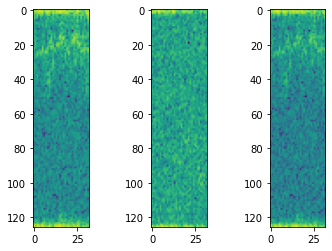

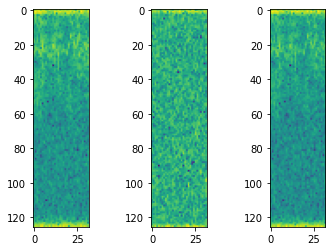

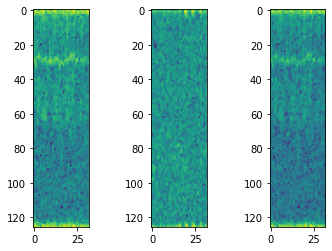

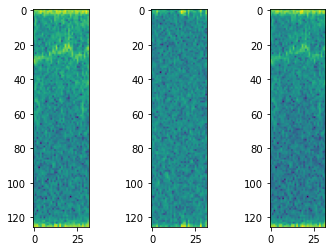

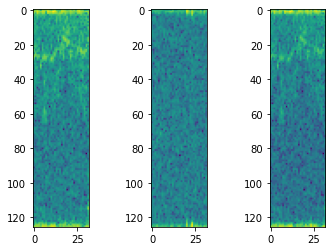

...

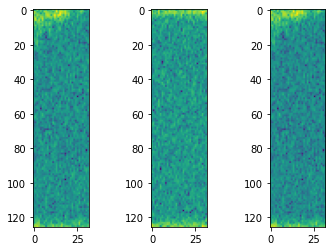

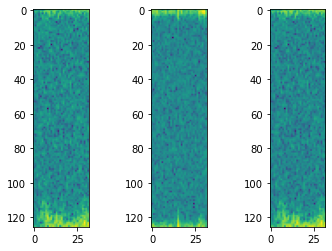

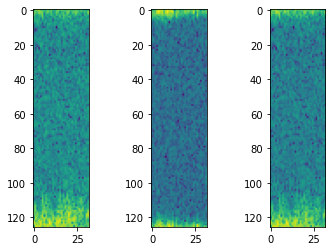

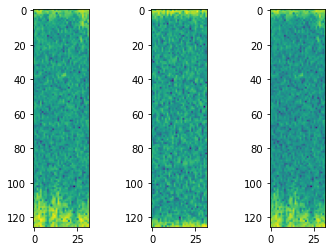

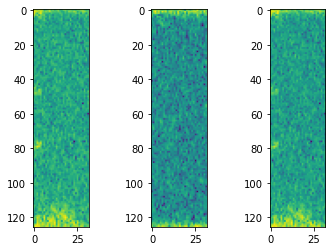

KeyboardInterrupt: 

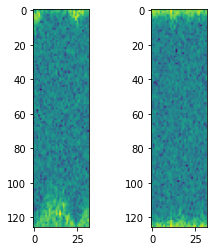

In [162]:
alpha = 0.8
for i in range(len(concat_index)):
    plt.subplot(131)
    a = normalize(fft(concat_data["iq_sweep_burst"][concat_index[i]]))
    plt.imshow(a)
    plt.subplot(132)
    b = normalize(fft(background_data["iq_sweep_burst"][background_index[i]]))
    plt.imshow(b)
    plt.subplot(133)
    c = (alpha * a) + ((1-alpha) * b)
    plt.imshow(normalize(c))
    plt.show()

# Check doppler bursts

In [37]:
import pandas as pd
from scipy import stats

In [4]:
train_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v5_w_burst.csv")
val_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_val_v5_w_burst.csv")

In [7]:
burst_columns = [x for x in train_df.columns if "burst_" in x]
train_bursts = train_df[burst_columns]
val_bursts = val_df[burst_columns]

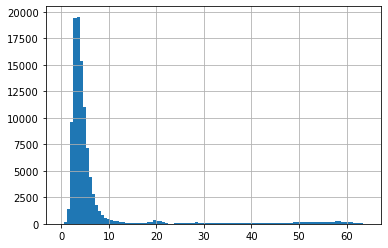

In [22]:
train_bursts.std(axis=1).hist(bins=100)

In [60]:
np.percentile(train_bursts.loc[train_bursts.std(axis=1).idxmax()], 50,  interpolation="lower")

1

In [ ]:
train_spectrogram = "/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_val_v5_spectrogram.npy"
train_spectrogram_centered = "/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v7_spectrogram.npy"

In [42]:
burst_modes = stats.mode(train_bursts, axis=1)

In [50]:
burst_modes[0]

array([[  4],
       [122],
       [ 30],
       ...,
       [115],
       [112],
       [122]])

In [63]:
np.percentile(train_bursts, 50, axis=1, interpolation="lower")

array([  7, 121,  30, ..., 113, 112, 122])

In [51]:
train_bursts.mean(axis=1)

0          29.28125
1         119.21875
2          34.43750
3          22.00000
4          24.00000
            ...    
106090    111.56250
106091    114.84375
106092    112.68750
106093    112.34375
106094    121.00000
Length: 106095, dtype: float64

In [52]:
train_bursts

,doppler_burst_0,doppler_burst_1,doppler_burst_2,doppler_burst_3,doppler_burst_4,doppler_burst_5,doppler_burst_6,doppler_burst_7,doppler_burst_8,doppler_burst_9,...,doppler_burst_22,doppler_burst_23,doppler_burst_24,doppler_burst_25,doppler_burst_26,doppler_burst_27,doppler_burst_28,doppler_burst_29,doppler_burst_30,doppler_burst_31
0,123,123,123,5,5,6,5,9,4,4,...,7,7,7,7,7,4,4,124,122,122
1,122,122,122,122,123,120,120,117,119,122,...,115,118,114,113,114,119,119,113,107,115
2,75,75,75,55,32,31,33,36,30,31,...,27,30,30,29,26,30,27,26,26,28
3,25,25,27,26,29,28,25,24,18,22,...,17,21,22,21,22,21,23,20,19,19
4,22,25,21,24,22,21,21,25,24,25,...,24,23,23,25,25,23,25,25,23,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106090,105,105,115,124,124,111,113,114,122,109,...,109,108,106,107,107,109,107,103,124,110
106091,113,108,109,115,112,115,104,116,112,115,...,113,123,114,116,123,117,117,112,112,113
106092,110,115,110,107,113,107,112,109,115,116,...,110,118,116,116,119,108,114,110,116,115
106093,111,111,112,117,116,114,116,108,117,109,...,113,112,114,114,113,114,117,115,110,118


In [64]:
train_uncentered_spectrogram = np.load("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v5_spectrogram.npy")

In [69]:
np.mean(train_bursts.iloc[0, :])

29.28125

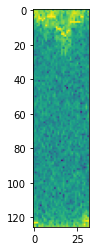

In [66]:
plt.imshow(train_uncentered_spectrogram[0])

In [76]:
np.percentile(train_bursts.iloc[0, :], 50, interpolation="lower")

7

In [72]:
np.median(train_bursts.iloc[0, :])

7.0

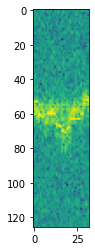

In [71]:
offset = 63 - int(np.median(train_bursts.iloc[0, :]))
spectrogram = np.roll(train_uncentered_spectrogram[0], offset, axis=0)
plt.imshow(spectrogram)

In [82]:
biggest_std_idx = train_bursts.std(axis=1).idxmax()

In [84]:
train_bursts.iloc[biggest_std_idx, :]

doppler_burst_0       1
doppler_burst_1       1
doppler_burst_2     127
doppler_burst_3     127
doppler_burst_4       1
doppler_burst_5       1
doppler_burst_6     127
doppler_burst_7       1
doppler_burst_8     127
doppler_burst_9     127
doppler_burst_10    127
doppler_burst_11      1
doppler_burst_12    127
doppler_burst_13    127
doppler_burst_14    127
doppler_burst_15    127
doppler_burst_16    127
doppler_burst_17      1
doppler_burst_18      1
doppler_burst_19      1
doppler_burst_20    127
doppler_burst_21      1
doppler_burst_22      1
doppler_burst_23    127
doppler_burst_24      1
doppler_burst_25    127
doppler_burst_26      1
doppler_burst_27      1
doppler_burst_28    127
doppler_burst_29      1
doppler_burst_30      1
doppler_burst_31    127
Name: 397, dtype: int64

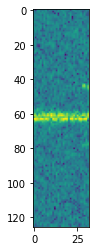

In [85]:
offset = 63 - int(np.median(train_bursts.iloc[biggest_std_idx, :]))
offset = 63 - int(np.percentile(train_bursts.iloc[biggest_std_idx, :], 50, interpolation="lower"))
spectrogram = np.roll(train_uncentered_spectrogram[biggest_std_idx], offset, axis=0)
plt.imshow(spectrogram)

# Watch new spectrogram (v9)

In [2]:
spectrogram = np.load("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v9_spectrogram.npy")

In [ ]:
for spec in spectrogram:
    plt.figure()
    plt.imshow(spec)
    plt.show()

# Observing public test

In [3]:
import pandas as pd
test_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Public Test Set V1.csv")

In [12]:
test_df

,segment_id,snr_type
0,6656,HighSNR
1,6658,HighSNR
2,6662,LowSNR
3,6664,LowSNR
4,6665,LowSNR
...,...,...
101,6987,HighSNR
102,6994,HighSNR
103,6995,HighSNR
104,6998,HighSNR


In [8]:
test_df.segment_id.iloc[-1] - test_df.segment_id.iloc[0]

345

In [10]:
train_df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/MAFAT RADAR Challenge - Training Set V1.csv")

In [11]:
train_df

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
0,0,11,C,1,1,HighSNR,27,animal
1,1,16,C,1,1,HighSNR,27,animal
2,2,16,C,1,1,HighSNR,27,animal
3,3,29,C,1,1,HighSNR,27,animal
4,4,29,C,1,1,HighSNR,27,animal
...,...,...,...,...,...,...,...,...
6651,6651,300,D,4,4,LowSNR,32,human
6652,6652,300,D,4,4,LowSNR,32,human
6653,6653,300,D,4,4,LowSNR,32,human
6654,6654,347,D,4,4,LowSNR,32,human


## Observing what I am using

In [14]:
df_train = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v5.csv")
df_val = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_val_v5.csv")

In [18]:
df_train.groupby(["sensor_id", "geolocation_id", "geolocation_type", "target_type", "source"]).count()

segment_id  \
sensor_id geolocation_id geolocation_type target_type source               
1         1              C                0           synth          191   
                                                      train          389   
                                          1           synth          370   
                                                      train          397   
2         2              A                0           synth          190   
                                                      train          251   
3         3              A                0           synth         1043   
                                                      train         4560   
4         4              D                0           synth          159   
                                                      train          398   
                                          1           synth          306   
                                                      train          352   
5         5              C                1           aux           5149   
                                                      synth         4963   
6         5              C                1           aux           5764   
                                                      synth         5750   
7         5              C                1           aux           3055   
                                                      synth         2999   
8         6              D                1           aux           5603   
                                                      synth         5573   
9         6              D                1           aux           2715   
                                                      synth         2641   
10        6              D                1           aux           6153   
                                                      synth         6103   
11        7              D                1           aux           5453   
                                                      synth         5441   
12        7              D                1           aux           8013   
                                                      synth         7845   
13        7              D                1           aux           7166   
                                                      synth         7103   

                                                              track_id  \
sensor_id geolocation_id geolocation_type target_type source             
1         1              C                0           synth        191   
                                                      train        389   
                                          1           synth        370   
                                                      train        397   
2         2              A                0           synth        190   
                                                      train        251   
3         3              A                0           synth       1043   
                                                      train       4560   
4         4              D                0           synth        159   
                                                      train        398   
                                          1           synth        306   
                                                      train        352   
5         5              C                1           aux         5149   
                                                      synth       4963   
6         5              C                1           aux         5764   
                                                      synth       5750   
7         5              C                1           aux         3055   
                                                      synth       2999   
8         6              D                1           aux         5603   
                                                      synth       5573   
9

In [28]:
df_val.groupby(["target_type", "track_id"]).count()

segment_id  geolocation_type  geolocation_id  sensor_id  \
target_type track_id                                                            
0           11                 3                 3               3          3   
            14                 1                 1               1          1   
            15                 1                 1               1          1   
            27                 1                 1               1          1   
            29                 4                 4               4          4   
...                          ...               ...             ...        ...   
1           298                5                 5               5          5   
            300                5                 5               5          5   
            326                2                 2               2          2   
            327                2                 2               2          2   
            347                7                 7               7          7   

                      snr_type  date_index  source  
target_type track_id                                
0           11               3           3       3  
            14               1           1       1  
            15               1           1       1  
            27               1           1       1  
            29               4           4       4  
...                        ...         ...     ...  
1           298              5           5       5  
            300              5           5       5  
            326              2           2       2  
            327              2           2       2  
            347              7           7       7  

[216 rows x 7 columns]

In [29]:
df_train

,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type,source
0,1,16,C,1,1,HighSNR,27,0,train
1,2,16,C,1,1,HighSNR,27,0,train
2,3,29,C,1,1,HighSNR,27,0,train
3,4,29,C,1,1,HighSNR,27,0,train
4,5,29,C,1,1,HighSNR,27,0,train
...,...,...,...,...,...,...,...,...,...
106090,64770,281988,D,7,13,SynthSNR,3,1,synth
106091,64771,281988,D,7,13,SynthSNR,3,1,synth
106092,64772,281988,D,7,13,SynthSNR,3,1,synth
106093,64773,281988,D,7,13,SynthSNR,3,1,synth


In [ ]:
# Splits

In [30]:
from sklearn.model_selection import GroupKFold
group_kfold = GroupKFold(n_splits=5)
group_kfold.get_n_splits(df_train.index, df_train.target_type, df_train.track_id)

5

In [33]:
train_index_list = []
test_index_list = []
for train_index, test_index in group_kfold.split(df_train.index, df_train.target_type, df_train.track_id):
    train_index_list.append(train_index)
    test_index_list.append(test_index)

In [37]:
df_train.loc[train_index_list[0]].shape

(84876, 9)

In [39]:
df_train.loc[test_index_list[0]].shape

(21219, 9)

# Analyze training folds data

In [10]:
for x in range(5):
    df = pd.read_csv("/home/agarcia/repos/mafat-radar-challenge/mafat_radar_challenge/data/mafat_train_v9_fold{}.csv".format(x))
    aux_segments = df.loc[df.source == "aux", "segment_id"].values
    df.loc[df.segment_id.isin(aux_segments), "source"] = "aux"
    df.loc[~df.segment_id.isin(aux_segments), "source"] = "train"
    display(df.groupby("target_type").count())
    display(df.groupby("source").count())

,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,source
target_type,,,,,,,,,
0,5945,5945,5945,5945,5945,5945,5945,5945,5945
1,79343,79343,79343,79343,79343,79343,79343,79343,79343


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
source,,,,,,,,,
aux,78047,78047,78047,78047,78047,78047,78047,78047,78047
train,7241,7241,7241,7241,7241,7241,7241,7241,7241


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,source
target_type,,,,,,,,,
0,5841,5841,5841,5841,5841,5841,5841,5841,5841
1,79447,79447,79447,79447,79447,79447,79447,79447,79447


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
source,,,,,,,,,
aux,78065,78065,78065,78065,78065,78065,78065,78065,78065
train,7223,7223,7223,7223,7223,7223,7223,7223,7223


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,source
target_type,,,,,,,,,
0,5999,5999,5999,5999,5999,5999,5999,5999,5999
1,79289,79289,79289,79289,79289,79289,79289,79289,79289


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
source,,,,,,,,,
aux,77809,77809,77809,77809,77809,77809,77809,77809,77809
train,7479,7479,7479,7479,7479,7479,7479,7479,7479


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,source
target_type,,,,,,,,,
0,5909,5909,5909,5909,5909,5909,5909,5909,5909
1,79379,79379,79379,79379,79379,79379,79379,79379,79379


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
source,,,,,,,,,
aux,78051,78051,78051,78051,78051,78051,78051,78051,78051
train,7237,7237,7237,7237,7237,7237,7237,7237,7237


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,source
target_type,,,,,,,,,
0,5950,5950,5950,5950,5950,5950,5950,5950,5950
1,79338,79338,79338,79338,79338,79338,79338,79338,79338


,index,segment_id,track_id,geolocation_type,geolocation_id,sensor_id,snr_type,date_index,target_type
source,,,,,,,,,
aux,77984,77984,77984,77984,77984,77984,77984,77984,77984
train,7304,7304,7304,7304,7304,7304,7304,7304,7304


In [7]:
(5950/79338.0)*100

7.499558849479443